# **DATASET 1 : PhenoBench Dataset for Leaf Segmentation**


[LINK TO DATASET](https://www.phenobench.org/)

In [2]:
import os
import glob
import shutil
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Setting up the file paths for the dataset.

The dataset structure (as per our use) is as follows:

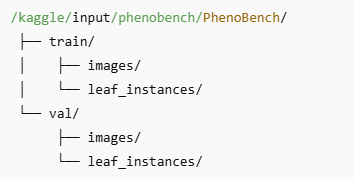
      

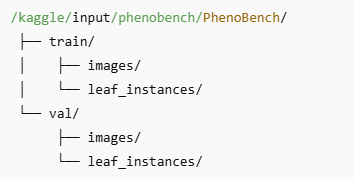

In [ ]:
base_dir = '/kaggle/input/phenobench/PhenoBench/'

train_images_dir = os.path.join(base_dir, 'train', 'images')
train_annots_dir = os.path.join(base_dir, 'train', 'leaf_visibility')
val_images_dir = os.path.join(base_dir, 'val', 'images')
val_annots_dir = os.path.join(base_dir, 'val', 'leaf_visibility')


split_dir = '/kaggle/working/train_split'
train_split_dir = os.path.join(split_dir, 'train')
test_split_dir = os.path.join(split_dir, 'myTestSet')


for folder in [train_split_dir, test_split_dir]:
    os.makedirs(os.path.join(folder, 'images'), exist_ok=True)
    os.makedirs(os.path.join(folder, 'leaf_visibility'), exist_ok=True)

print("Directory paths set up successfully.")

Directory paths set up successfully.


# HELPER FUNCTIONS TO CREATE MY CLASSES
This function reads an annotation mask (grayscale) and converts it to a binary mask. In the binary mask, any pixel value greater than 0 becomes 1 (leaf) while 0 remains the background.

In [ ]:
def binary_mask_to_class_indices(mask):
  
    return np.where(mask > 0, 1, 0).astype(np.uint8)

def convert_and_save_annotation(source_path, dest_path):
    
    mask = cv2.imread(source_path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        raise ValueError(f"Unable to load annotation from: {source_path}")
    binary_mask = binary_mask_to_class_indices(mask)
    cv2.imwrite(dest_path, binary_mask)

def convert_validation_masks(input_folder, output_folder):
   
    os.makedirs(output_folder, exist_ok=True)
    val_mask_paths = glob.glob(os.path.join(input_folder, '*'))
    for path in val_mask_paths:
        filename = os.path.basename(path)
        mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            print(f"Could not load mask: {filename}, skipping.")
            continue
        binary_mask = binary_mask_to_class_indices(mask)
        output_path = os.path.join(output_folder, filename)
        cv2.imwrite(output_path, binary_mask)

# Splitting the Data
In this cell, we list all the training images from the original train folder, split them into 85% for training and 15% for testing, and copy both the images and their corresponding annotation files to the new directories in the /kaggle/working area.

In [ ]:

all_train_images = glob.glob(os.path.join(train_images_dir, '*'))
all_train_images.sort() 


filtered_train_images = []
for img_path in all_train_images:
    filename = os.path.basename(img_path)
    annot_path = os.path.join(train_annots_dir, filename)
    if os.path.exists(annot_path):
        filtered_train_images.append(img_path)
    else:
        print(f"Skipping {filename} because annotation not found.")

print(f"Total original train images: {len(all_train_images)}")
print(f"Images with annotations: {len(filtered_train_images)}")

train_files, test_files = train_test_split(filtered_train_images, test_size=0.15, random_state=42)

print(f"Images in new training split: {len(train_files)}")
print(f"Images in new testing split: {len(test_files)}")

def copy_files(file_list, source_img_dir, source_annot_dir, dest_img_dir, dest_annot_dir):
    for img_path in file_list:
        filename = os.path.basename(img_path)
  
        shutil.copy(os.path.join(source_img_dir, filename), os.path.join(dest_img_dir, filename))
        annot_source = os.path.join(source_annot_dir, filename)
        dest_annot = os.path.join(dest_annot_dir, filename)
        if os.path.exists(annot_source):
            convert_and_save_annotation(annot_source, dest_annot)
        else:
            print(f"Annotation for {filename} not found, skipping copy.")

copy_files(train_files, train_images_dir, train_annots_dir,
           os.path.join(train_split_dir, 'images'),
           os.path.join(train_split_dir, 'leaf_visibility'))

copy_files(test_files, train_images_dir, train_annots_dir,
           os.path.join(test_split_dir, 'images'),
           os.path.join(test_split_dir, 'leaf_visibility'))

print("Files copied into training and testing splits successfully.")


Total original train images: 1407
Images with annotations: 1407
Images in new training split: 1195
Images in new testing split: 212
Files copied into training and testing splits successfully.


# Display Dataset Statistics and Number of Classes
This cell counts and displays the number of images in the new training split, testing split, and the validation set. It also loads one sample annotation mask from the training split to determine the number of unique classes (unique pixel values).

In [ ]:

num_train = len(glob.glob(os.path.join(train_split_dir, 'images', '*')))
num_test = len(glob.glob(os.path.join(test_split_dir, 'images', '*')))
num_val = len(glob.glob(os.path.join(val_images_dir, '*')))

print(f"Number of images in Training Split: {num_train}")
print(f"Number of images in Testing Split: {num_test}")
print(f"Number of images in Validation Set: {num_val}")

sample_annot_path = glob.glob(os.path.join(train_split_dir, 'leaf_visibility', '*'))[0]
sample_annot = cv2.imread(sample_annot_path, cv2.IMREAD_GRAYSCALE)

unique_values = np.unique(sample_annot)
print(f"Unique label values in sample annotation: {unique_values}")
print("Class mapping:")
print("   0: background")
print("   1: leaf")
print(f"Number of classes : {len(unique_values)}")


Number of images in Training Split: 1195
Number of images in Testing Split: 212
Number of images in Validation Set: 772
Unique label values in sample annotation: [0 1]
Class mapping:
   0: background
   1: leaf
Number of classes : 2


# Display Sample Images and Annotations from the Training Split
This cell randomly selects a few images from the new training split and displays them alongside their corresponding annotation masks. This visual check helps ensure that the data and annotations align correctly.

Displaying sample images and annotations from the training split:


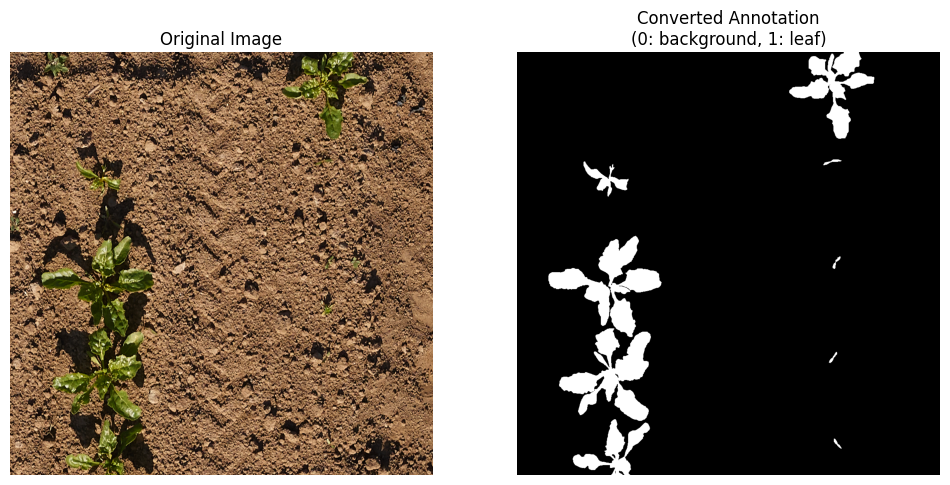

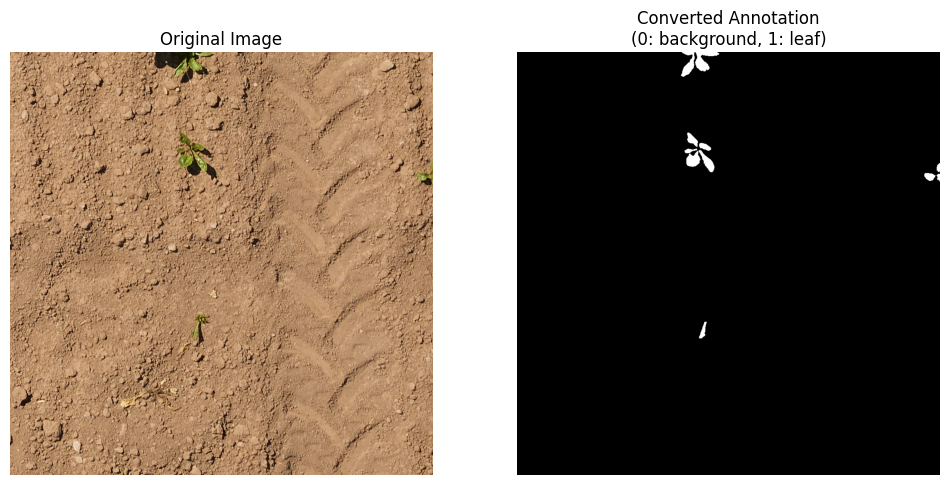

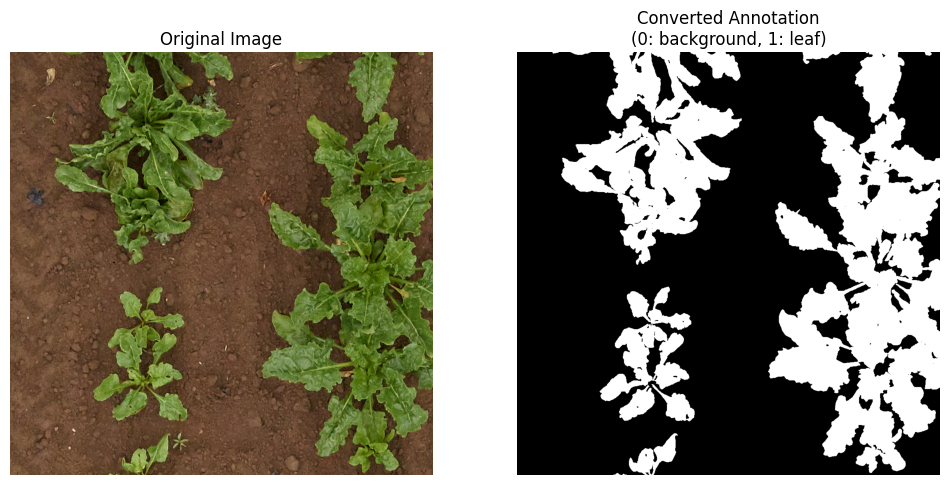

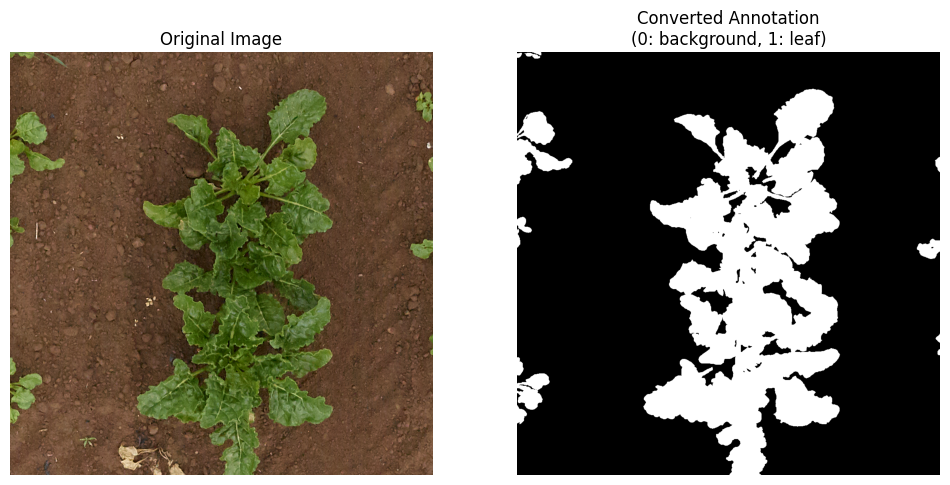

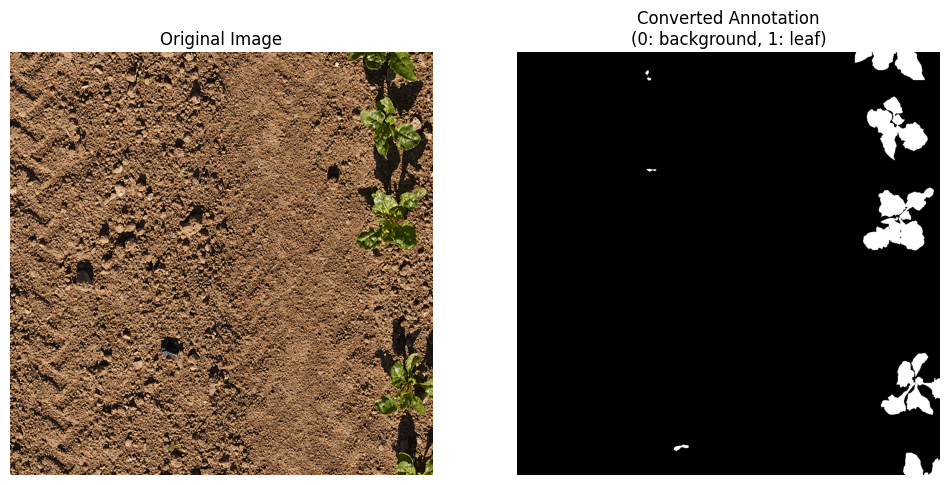

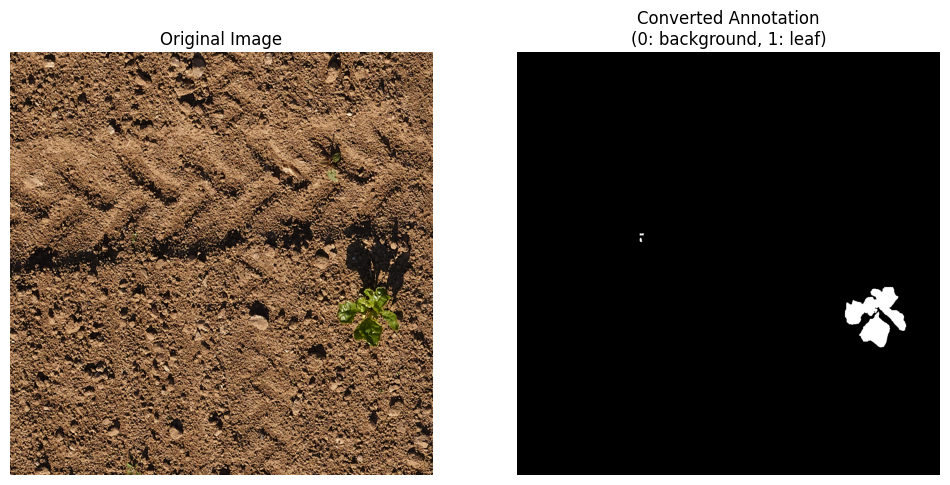

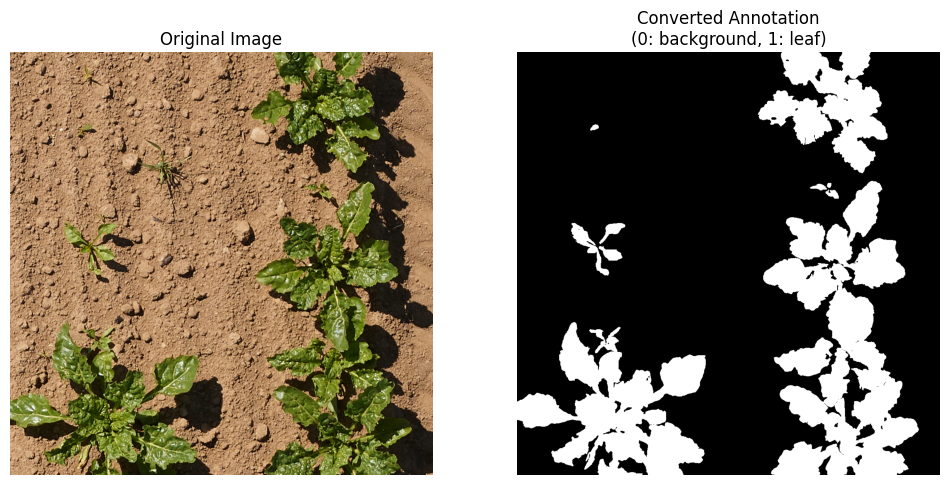

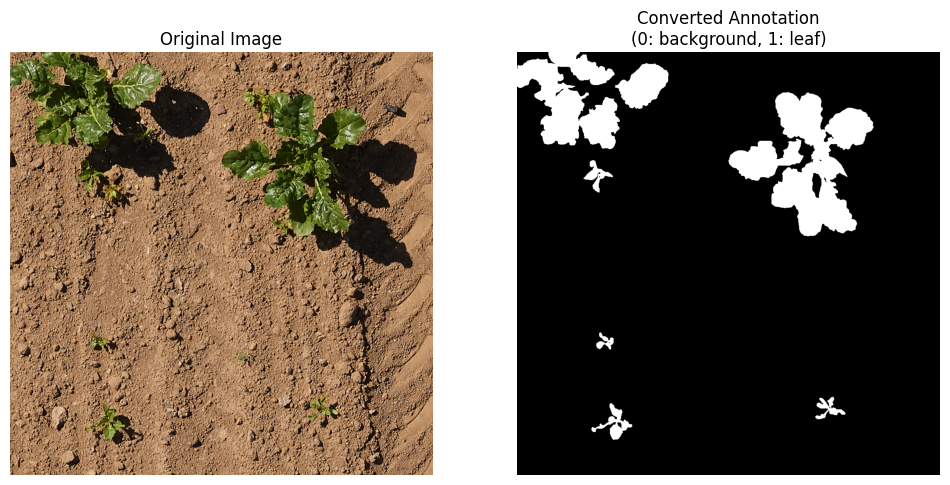

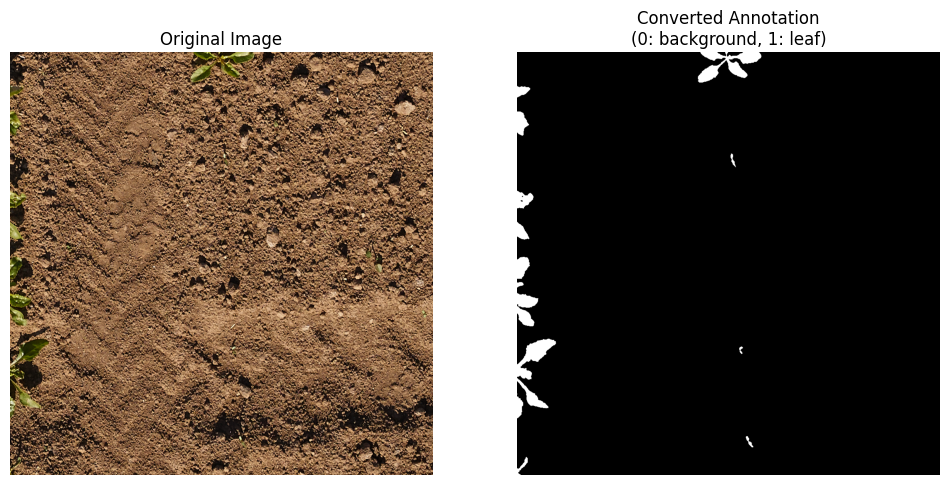

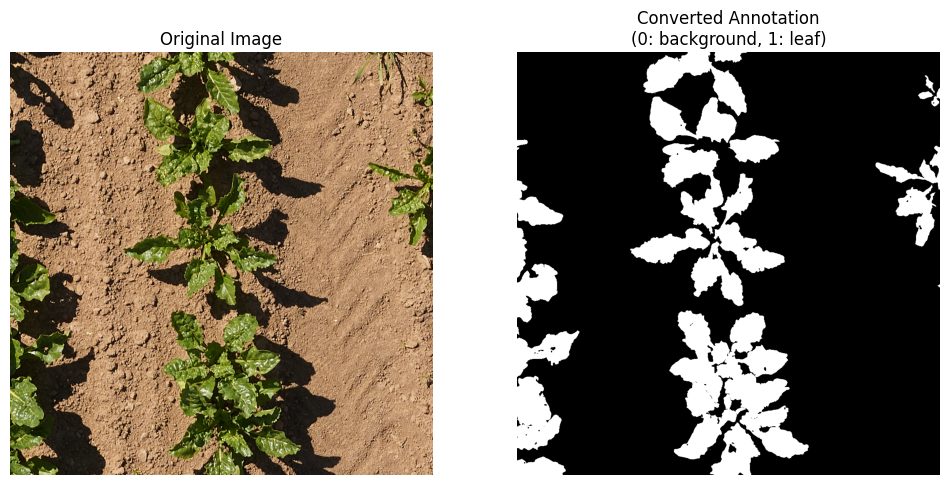

In [ ]:
def display_sample(image_path, annot_path):
   
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    annot = cv2.imread(annot_path, cv2.IMREAD_GRAYSCALE)
    
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(annot, cmap='gray')
    plt.title("Converted Annotation\n(0: background, 1: leaf)")
    plt.axis('off')
    
    plt.show()


train_img_files = sorted(glob.glob(os.path.join(train_split_dir, 'images', '*')))
train_annot_files = sorted(glob.glob(os.path.join(train_split_dir, 'leaf_visibility', '*')))


sample_indices = random.sample(range(len(train_img_files)), 10)

print("Displaying sample images and annotations from the training split:")
for idx in sample_indices:
    img_path = train_img_files[idx]
    annot_path = os.path.join(train_split_dir, 'leaf_visibility', os.path.basename(img_path))
    display_sample(img_path, annot_path)


# Display Sample Images and Annotations from the Validation Set
Similarly, this cell randomly selects a few images from the validation set and displays them with their corresponding annotation masks for visual inspection.

Displaying sample images and annotations from the validation set:


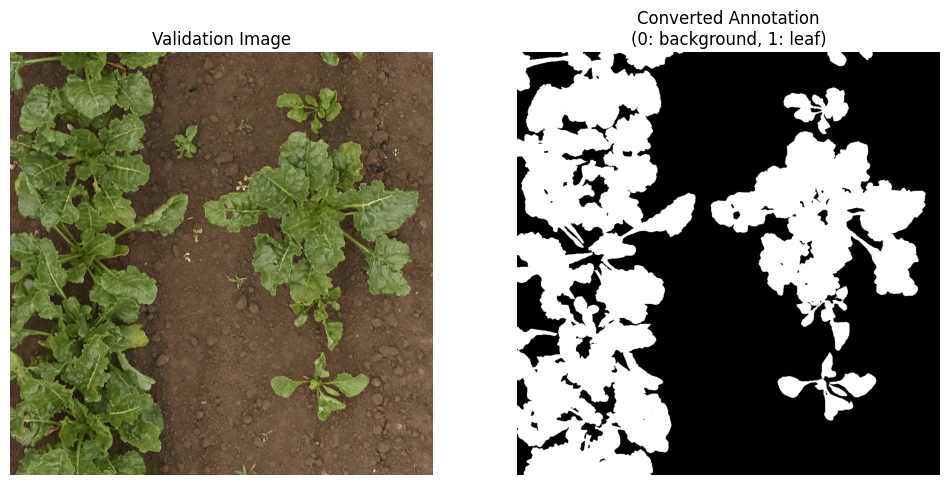

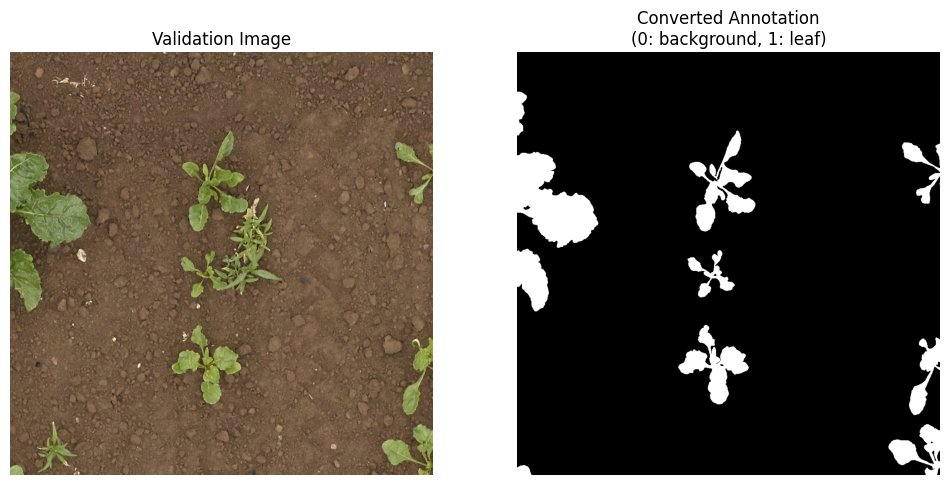

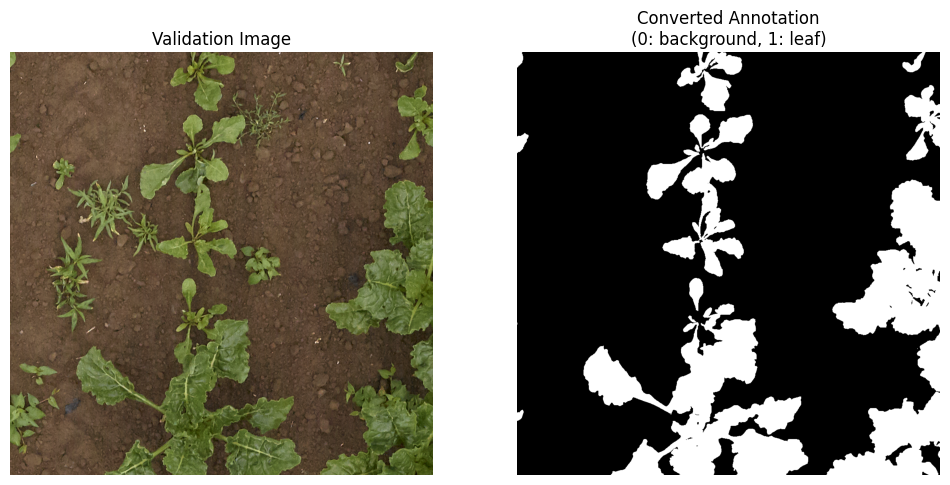

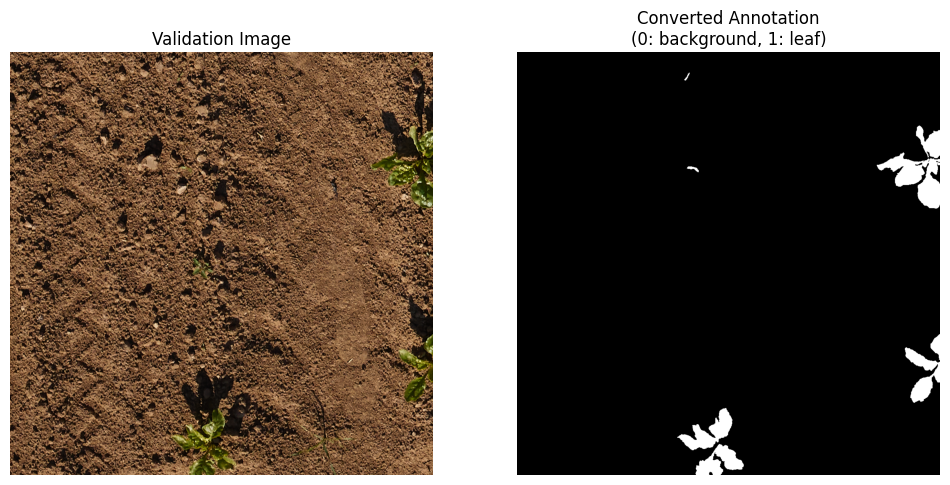

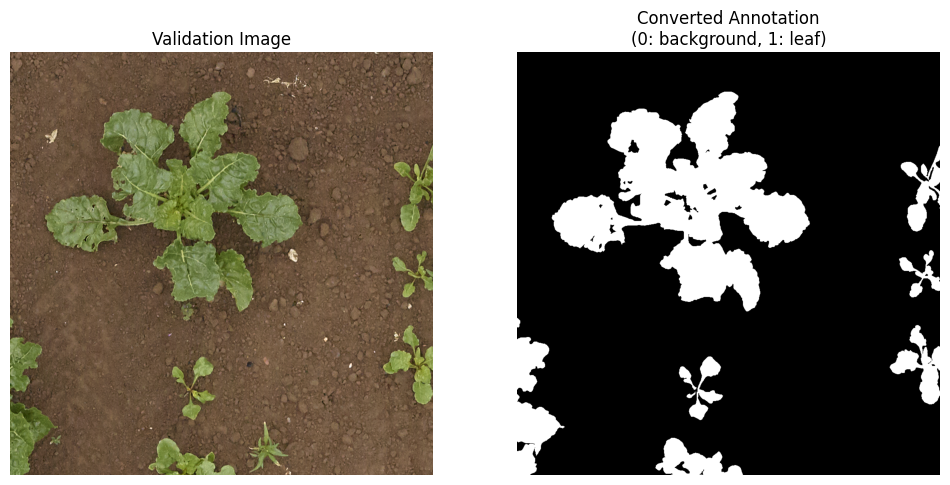

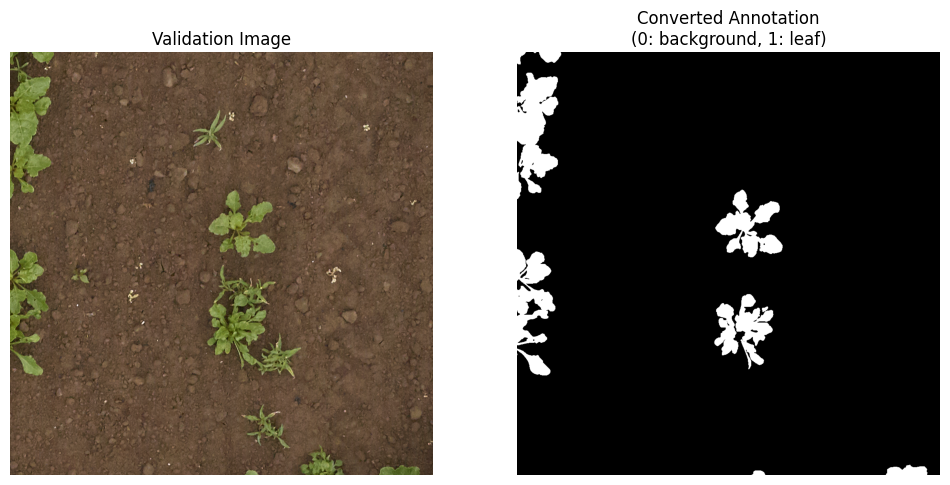

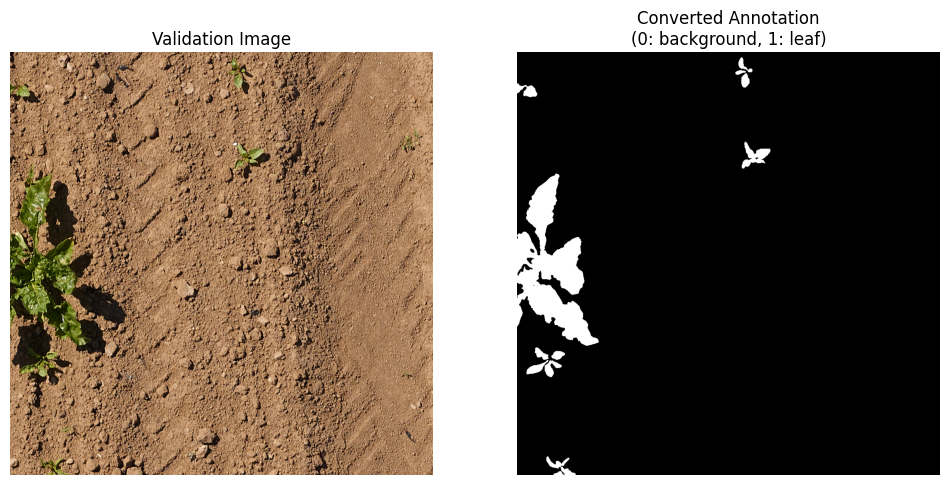

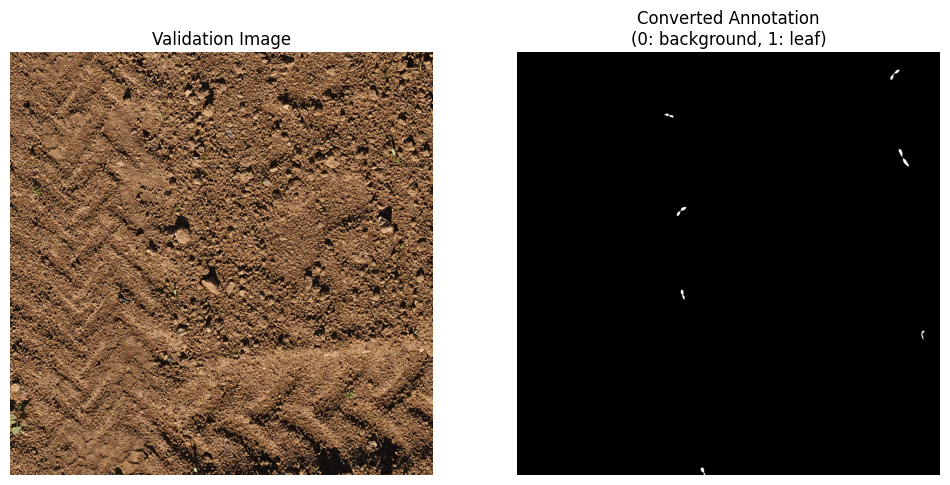

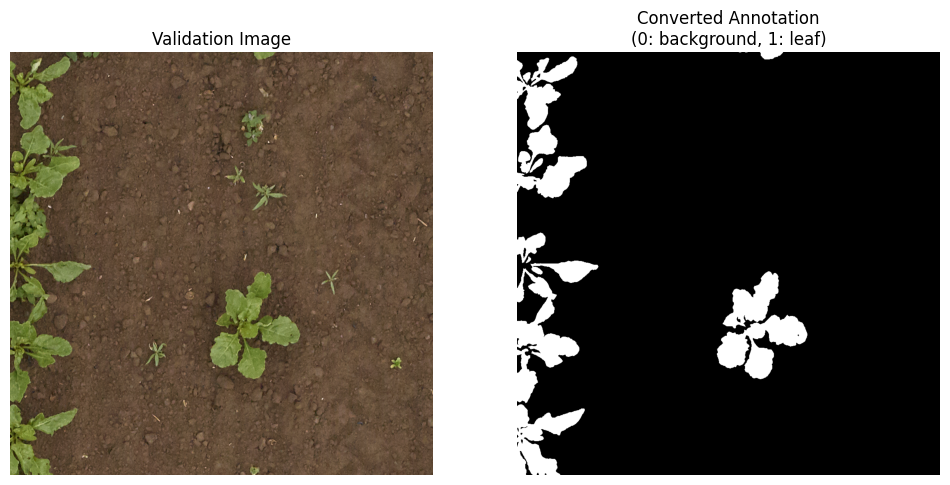

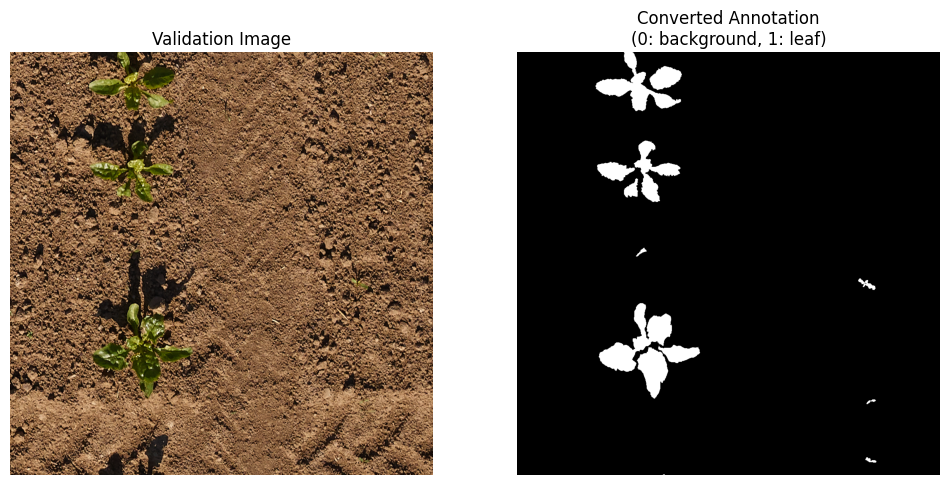

In [ ]:

converted_val_annots_dir = '/kaggle/working/val_converted_masks'
convert_validation_masks(val_annots_dir, converted_val_annots_dir)

def display_val_sample(image_path, annot_path):
   
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    annot = cv2.imread(annot_path, cv2.IMREAD_GRAYSCALE)
    
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Validation Image")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(annot, cmap='gray')
    plt.title("Converted Annotation\n(0: background, 1: leaf)")
    plt.axis('off')
    
    plt.show()


val_img_files = sorted(glob.glob(os.path.join(val_images_dir, '*')))
val_conv_annot_files = sorted(glob.glob(os.path.join(converted_val_annots_dir, '*')))


sample_indices_val = random.sample(range(len(val_img_files)), 10)

print("Displaying sample images and annotations from the validation set:")
for idx in sample_indices_val:
    img_path = val_img_files[idx]
    annot_path = os.path.join(converted_val_annots_dir, os.path.basename(img_path))
    display_val_sample(img_path, annot_path)
